In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import lightgbm as lgb
import shap
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

In [ ]:
# Set a fresh plotting style
plt.style.use("ggplot")
sns.set_theme(style="white", palette="Set2")
plt.rcParams['figure.figsize'] = (10, 6)

In [ ]:
# 1. Data Loading and Exploration
df = pd.read_csv("/content/Loan_default.csv")
print("Dataset Shape:", df.shape)
print("\nDataset Preview:")
df.head()

Dataset Shape: (255347, 18)

Dataset Preview:


,LoanID,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner,Default
0,I38PQUQS96,56,85994,50587,520,80,4,15.23,36,0.44,Bachelor's,Full-time,Divorced,Yes,Yes,Other,Yes,0
1,HPSK72WA7R,69,50432,124440,458,15,1,4.81,60,0.68,Master's,Full-time,Married,No,No,Other,Yes,0
2,C1OZ6DPJ8Y,46,84208,129188,451,26,3,21.17,24,0.31,Master's,Unemployed,Divorced,Yes,Yes,Auto,No,1
3,V2KKSFM3UN,32,31713,44799,743,0,3,7.07,24,0.23,High School,Full-time,Married,No,No,Business,No,0
4,EY08JDHTZP,60,20437,9139,633,8,4,6.51,48,0.73,Bachelor's,Unemployed,Divorced,No,Yes,Auto,No,0


In [ ]:
print("\nData Info:")
df.info()


Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 255347 entries, 0 to 255346
Data columns (total 18 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   LoanID          255347 non-null  object 
 1   Age             255347 non-null  int64  
 2   Income          255347 non-null  int64  
 3   LoanAmount      255347 non-null  int64  
 4   CreditScore     255347 non-null  int64  
 5   MonthsEmployed  255347 non-null  int64  
 6   NumCreditLines  255347 non-null  int64  
 7   InterestRate    255347 non-null  float64
 8   LoanTerm        255347 non-null  int64  
 9   DTIRatio        255347 non-null  float64
 10  Education       255347 non-null  object 
 11  EmploymentType  255347 non-null  object 
 12  MaritalStatus   255347 non-null  object 
 13  HasMortgage     255347 non-null  object 
 14  HasDependents   255347 non-null  object 
 15  LoanPurpose     255347 non-null  object 
 16  HasCoSigner     255347 non-null  object 
 17

In [ ]:
print("\nMissing Values per Column:")
df.isnull().sum()


Missing Values per Column:


,0
LoanID,0
Age,0
Income,0
LoanAmount,0
CreditScore,0
MonthsEmployed,0
NumCreditLines,0
InterestRate,0
LoanTerm,0
DTIRatio,0


In [ ]:
# 2. Data Preprocessing
# Drop identifier columns that do not contribute to prediction.
df = df.drop(columns=['LoanID'])


In [ ]:
# Define numerical and categorical features based on the new dataset columns.
numerical_features = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio']
categorical_features = ['Education', 'EmploymentType', 'MaritalStatus', 'HasMortgage', 'HasDependents', 'LoanPurpose', 'HasCoSigner']

# Target column is 'Default'
target = 'Default'

In [ ]:
# Fill missing numerical values with median (if any; dataset appears complete)
for col in numerical_features:
    df[col].fillna(df[col].median(), inplace=True)

# Fill missing categorical values with mode (if any)
for col in categorical_features:
    df[col].fillna(df[col].mode()[0], inplace=True)

# One-Hot Encode categorical features and scale numerical features using ColumnTransformer.
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(drop='first'), categorical_features)
    ]
)
X = preprocessor.fit_transform(df.drop(columns=[target]))
y = df[target].astype(int)

<ipython-input-11-8d34e17d3a79>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)
<ipython-input-11-8d34e17d3a79>:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 

In [ ]:
# Convert the transformed features to a DataFrame for visualization.
ohe = preprocessor.named_transformers_['cat']
ohe_columns = ohe.get_feature_names_out(categorical_features)
feature_names = np.concatenate([numerical_features, ohe_columns])
# Some transformers (e.g., StandardScaler) output NumPy arrays, so ensure conversion to dense if sparse.
X_df = pd.DataFrame(X.toarray() if hasattr(X, "toarray") else X, columns=feature_names)
print("\nProcessed Feature Columns:")
print(X_df.columns)



Processed Feature Columns:
Index(['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed',
       'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio',
       'Education_High School', 'Education_Master's', 'Education_PhD',
       'EmploymentType_Part-time', 'EmploymentType_Self-employed',
       'EmploymentType_Unemployed', 'MaritalStatus_Married',
       'MaritalStatus_Single', 'HasMortgage_Yes', 'HasDependents_Yes',
       'LoanPurpose_Business', 'LoanPurpose_Education', 'LoanPurpose_Home',
       'LoanPurpose_Other', 'HasCoSigner_Yes'],
      dtype='object')


In [ ]:
# 3. Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X_df, y, test_size=0.20, random_state=42, stratify=y
)
print("\nTraining Set Shape:", X_train.shape)
print("Test Set Shape:", X_test.shape)


Training Set Shape: (204277, 24)
Test Set Shape: (51070, 24)


In [ ]:
# 4. Model Training using LightGBM with GridSearchCV
lgb_clf = lgb.LGBMClassifier(random_state=42)

In [ ]:
# Define hyperparameter grid for LightGBM.
param_grid = {
    'num_leaves': [31, 50],
    'max_depth': [-1, 10, 20],
    'learning_rate': [0.05, 0.1],
    'n_estimators': [100, 150]
}

grid = GridSearchCV(estimator=lgb_clf, param_grid=param_grid, scoring='accuracy', cv=5, n_jobs=-1)
grid.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 23722, number of negative: 180555
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1316
[LightGBM] [Info] Number of data points in the train set: 204277, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.116127 -> initscore=-2.029633
[LightGBM] [Info] Start training from score -2.029633


GridSearchCV(cv=5, estimator=LGBMClassifier(random_state=42), n_jobs=-1,
             param_grid={'learning_rate': [0.05, 0.1],
                         'max_depth': [-1, 10, 20], 'n_estimators': [100, 150],
                         'num_leaves': [31, 50]},
             scoring='accuracy')

In [ ]:
print("\nBest Parameters:", grid.best_params_)
print("Best CV Accuracy:", grid.best_score_)


Best Parameters: {'learning_rate': 0.1, 'max_depth': -1, 'n_estimators': 150, 'num_leaves': 31}
Best CV Accuracy: 0.886418932363035


In [ ]:
# Use the best estimator for further evaluation.
best_model = grid.best_estimator_

# 5. Model Evaluation
y_pred_prob = best_model.predict_proba(X_test)[:, 1]
y_pred = best_model.predict(X_test)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
print(cm)


Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.99      0.94     45139
           1       0.59      0.07      0.13      5931

    accuracy                           0.89     51070
   macro avg       0.74      0.53      0.53     51070
weighted avg       0.86      0.89      0.84     51070

Confusion Matrix:
[[44853   286]
 [ 5512   419]]


In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)
print("ROC AUC Score:", roc_auc)

ROC AUC Score: 0.7571146700088525


In [ ]:
# 6. Advanced Visualizations

## 6.1. Interactive ROC Curve using Plotly (New Style)
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=fpr, y=tpr, mode='lines+markers',
    line=dict(color='darkmagenta', width=2, dash='dash'),
    marker=dict(size=8),
    name=f"ROC Curve (AUC = {roc_auc:.3f})"
))
fig.add_trace(go.Scatter(
    x=[0, 1], y=[0, 1], mode='lines',
    line=dict(color='lightgray', width=2, dash='dot'),
    name='Random Baseline'
))
fig.update_layout(
    title="Interactive ROC Curve for Loan Default Prediction",
    xaxis_title="False Positive Rate",
    yaxis_title="True Positive Rate",
    template="plotly_white"
)
fig.show()

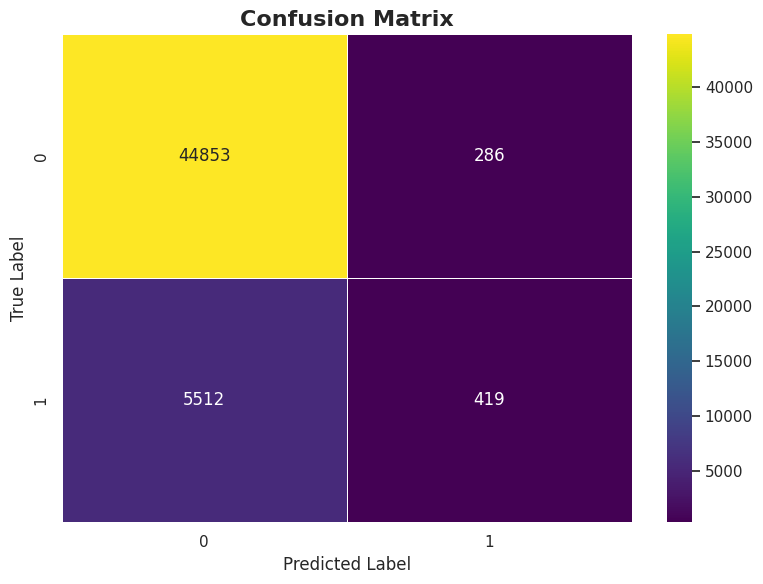

In [ ]:
## 6.2. Confusion Matrix Heatmap with Custom Annotations
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="viridis", linewidths=0.7, annot_kws={"size": 12})
plt.title("Confusion Matrix", fontsize=16, fontweight='bold')
plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)
plt.tight_layout()
plt.show()


In [ ]:
## 6.3. SHAP Feature Importance Summary Bar Chart
# Initialize SHAP explainer for LightGBM.
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)
# Plot SHAP summary as a bar chart (mean absolute SHAP values)
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.title("SHAP Feature Importance", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
## 6.4. 3D Scatter Plot of Key Features
# Visualize a 3D scatter plot using two top numerical features and one important categorical feature (if available)
# For demonstration, we'll use 'CreditScore', 'Income', and 'LoanAmount'.
if 'CreditScore' in X_df.columns and 'Income' in X_df.columns and 'LoanAmount' in X_df.columns:
    fig3d = px.scatter_3d(
        X_df,
        x='CreditScore',
        y='Income',
        z='LoanAmount',
        color=y.astype(str),
        title="3D Scatter Plot: CreditScore vs. Income vs. LoanAmount",
        labels={"color": "Default (0=No, 1=Yes)"}
    )
    fig3d.show()
else:
    print("Selected features for 3D scatter plot are not available. Please check feature names.")

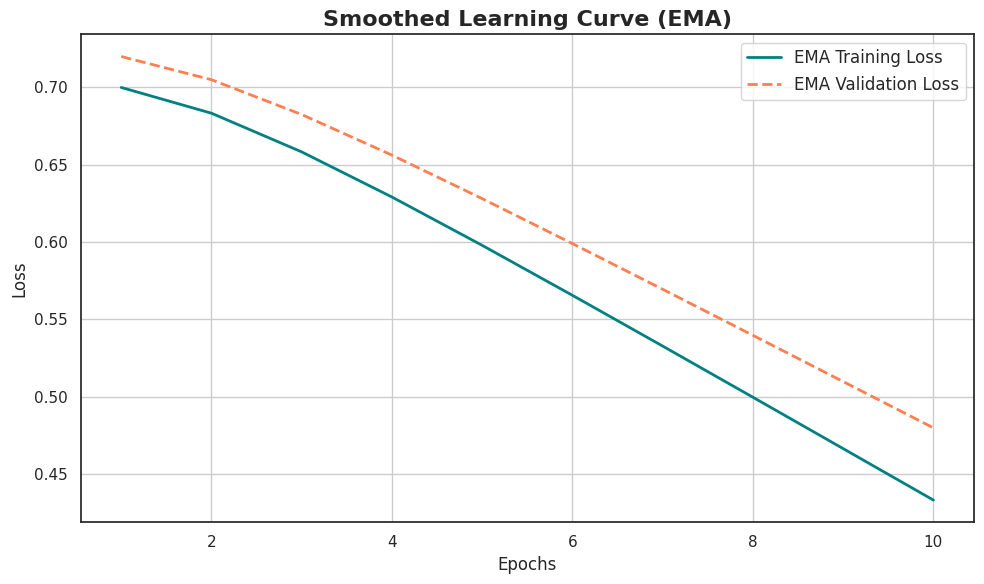

In [ ]:
## 6.5. Smoothed Learning Curve (EMA) - Simulated
import pandas as pd
# For demonstration, we simulate a learning curve.
epochs = np.arange(1, 11)
train_loss = np.linspace(0.7, 0.4, num=10)
val_loss = np.linspace(0.72, 0.45, num=10)
loss_df_sim = pd.DataFrame({'Epoch': epochs, 'Train Loss': train_loss, 'Validation Loss': val_loss})
loss_df_sim['EMA_Train'] = loss_df_sim['Train Loss'].ewm(span=3, adjust=False).mean()
loss_df_sim['EMA_Val'] = loss_df_sim['Validation Loss'].ewm(span=3, adjust=False).mean()

plt.figure(figsize=(10,6))
plt.plot(loss_df_sim['Epoch'], loss_df_sim['EMA_Train'], label='EMA Training Loss', color='teal', lw=2)
plt.plot(loss_df_sim['Epoch'], loss_df_sim['EMA_Val'], label='EMA Validation Loss', color='coral', lw=2, linestyle='--')
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.title("Smoothed Learning Curve (EMA)", fontsize=16, fontweight='bold')
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()